###Name

Wirapat  Prigphet         (Gene)  620510618<br>
Suppapich  Seetasith   (Yale)  620510626


###Import

In [ ]:
import cv2
import imageio
import math
import numpy as np
import os
import random
from PIL import Image
from PIL import ImageFilter
from google.colab.patches import cv2_imshow

####Read Image

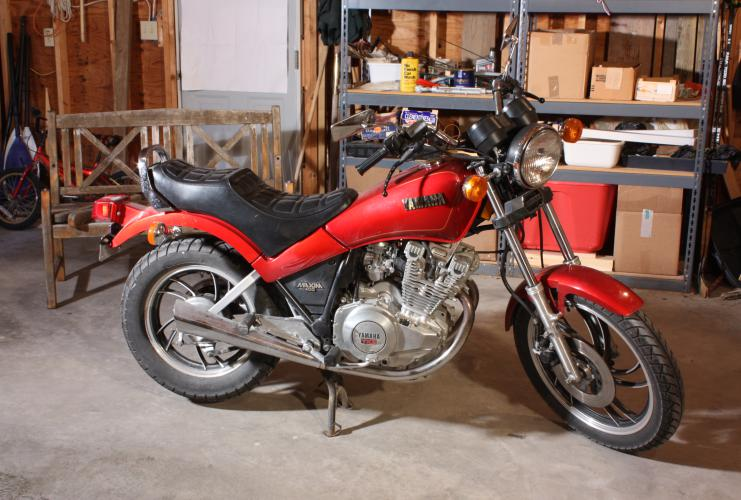

In [ ]:
image = cv2.imread("/content/motorcycle.jpg")

cv2_imshow(image)

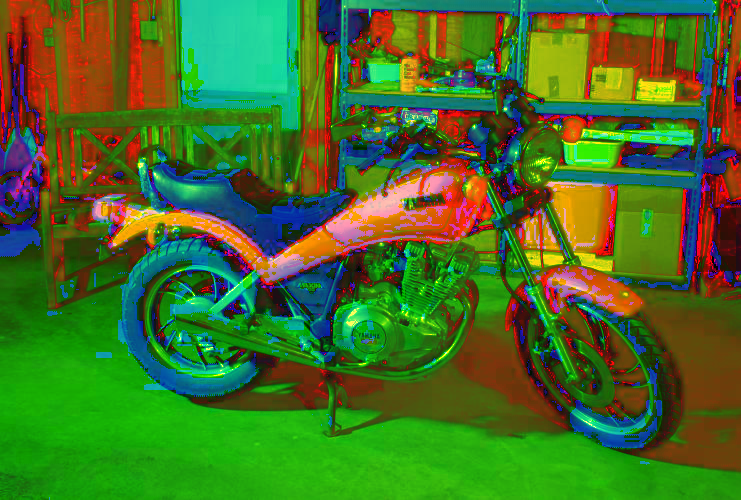

In [ ]:
hsi = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
cv2_imshow(hsi)

###Adding Noise

In [ ]:
def noisy(noise_typ,image):
  if noise_typ == "gauss":
      row,col,ch= image.shape
      mean = 0
      var = 1000
      sigma = var**0.5
      gauss = np.random.normal(mean,sigma,(row,col,ch))
      gauss = gauss.reshape(row,col,ch)
      noisy = image + gauss
      return noisy

  elif noise_typ == "s&p":
    row,col,ch = image.shape
    s_vs_p = 0.5
    amount = 0.1
    out = np.copy(image)
    # Salt mode
    num_salt = np.ceil(amount * image.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt))
            for i in image.shape]
    out[coords] = 1

    # Pepper mode
    num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper))
            for i in image.shape]
    out[coords] = 0
    return out
  elif noise_typ == "poisson":
    noise = np.random.poisson(75, image.shape)
    output = image + noise
    return output

  elif noise_typ =="speckle":
    row,col,ch = image.shape
    gauss = np.random.randn(row,col,ch)
    gauss = gauss.reshape(row,col,ch)        
    noisy = image + image * gauss
    return noisy


####result

#####Salt & Paper Noise

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


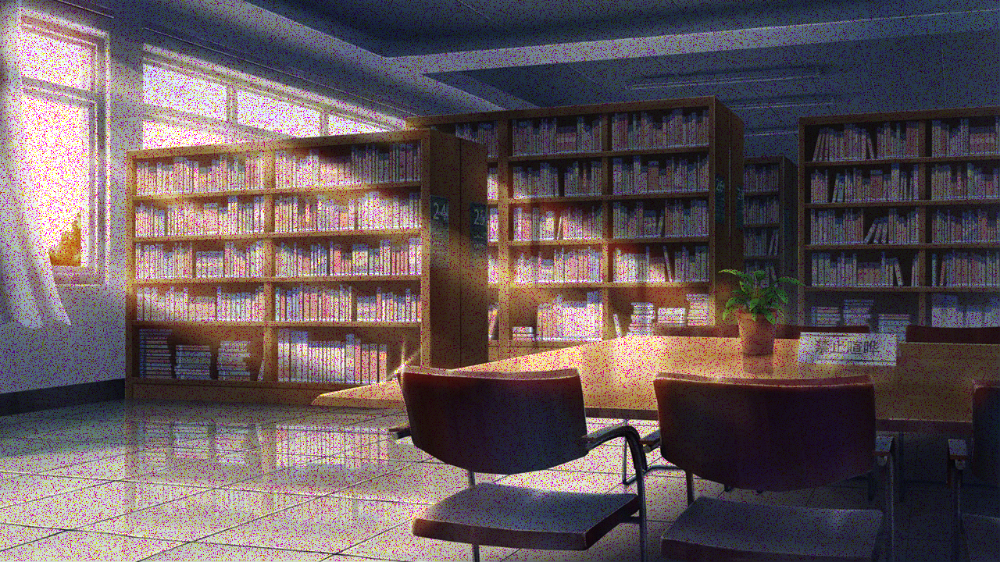

In [ ]:
sNp_image = noisy('s&p', image)
cv2_imshow(sNp_image)


From the result, there are some of dots which are outstanding shade from the hole image. To source of ths result, we random number between one and final value. If the number is the final value then the pixel will be changed with noise. This model is also known as data drop noise because statistically it drop the original data values

#####Gaussian-distributed Noise




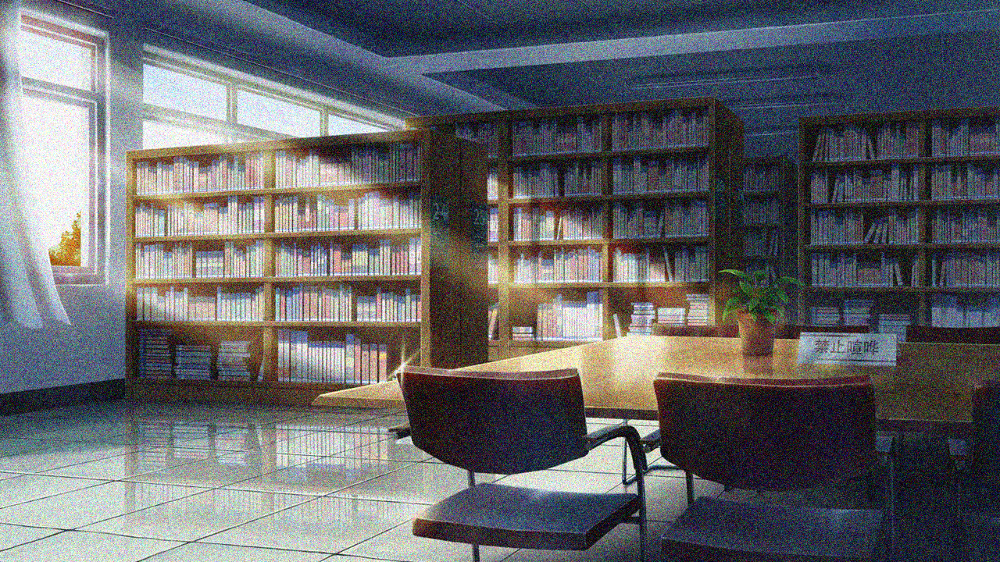

In [ ]:
gauss_image = noisy("gauss", image)
cv2_imshow(gauss_image)

For gaussian noise, to add noise, we add gaussian value which is randomed by normal destribution to ndarray of orinal image. This noise is generated in amplifiers or detectors

#####Poisson-distributed Noise

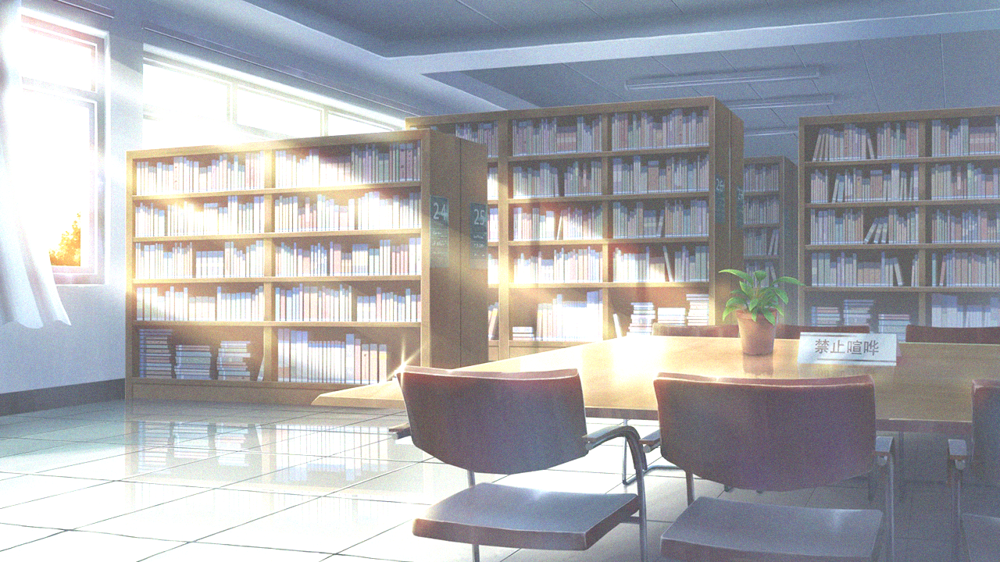

In [ ]:
poisson_image = noisy("poisson" , image)
cv2_imshow(poisson_image)

For this result, we bring image into randoming process in poisson distribution.Then we add noise value to image pixel. This noise is generated by nature of electromagnetic such as x-rays, visible lights and gamma rays.

#####Speckle Noise

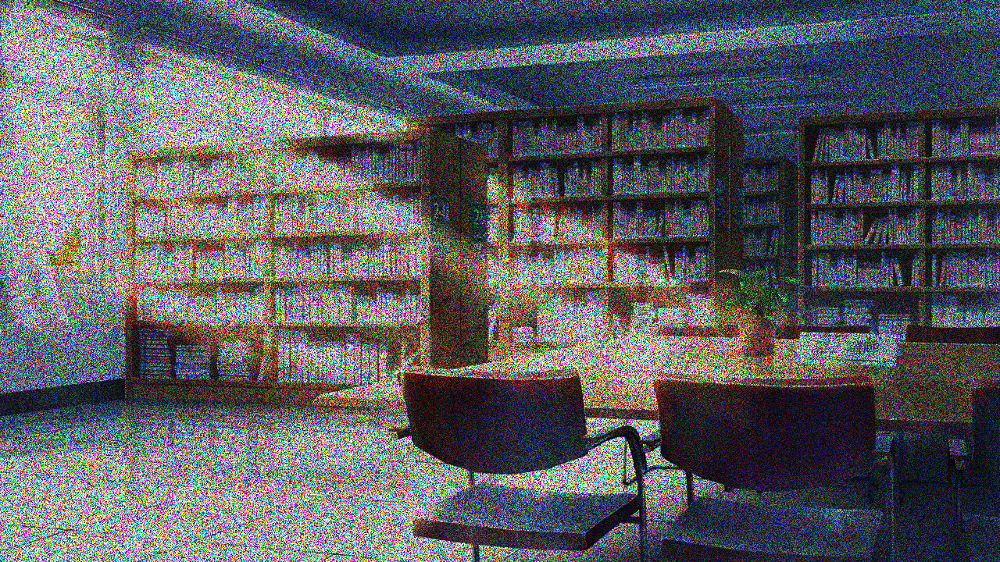

In [ ]:
speckle_image = noisy("speckle", image)
cv2_imshow(speckle_image)

This noise is generated by multiplying random pixel values with different pixel of an image. This noise is problem in optical and digital holography

###Image Transformation


####Negatives Transformation

In [ ]:
def negative_img(image):
  for i in range(0, image.size[0]-1):

    for j in range(0, image.size[1]-1):
      pixelColorVals = image.getpixel((i,j));
      
      redPixel    = 255 - pixelColorVals[0]; # Negate red pixel
      greenPixel  = 255 - pixelColorVals[1]; # Negate green pixel
      bluePixel   = 255 - pixelColorVals[2]; # Negate blue pixel
      
      image.putpixel((i,j),(redPixel, greenPixel, bluePixel));


  return image

####Result

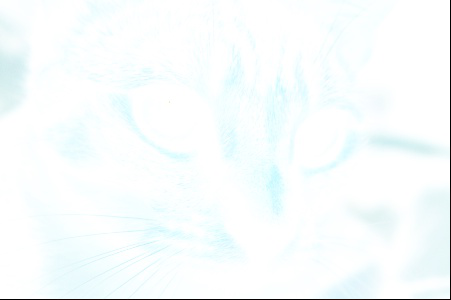

In [ ]:
im = Image.open("/content/mystery.jpg")
img_n = negative_img(im)
img_n

as the result, we will see that lighter pixel becomes dark and darker pixel becomes light. Negative transformation is used in medical photograph and remote sensing

####Logarithmic Transformation

In [ ]:
def logTransform(c, f):

    g = c * math.log(float(1 + f),10);

    return g;

 
def logTransformImage(image, outputMax = 255, inputMax=255):
    c = outputMax/math.log(inputMax+1,10);
    
    for i in range(0, img.size[0]-1):
        for j in range(0, img.size[1]-1):

            f = img.getpixel((i,j));

            redPixel    = round(logTransform(c, f[0]));
            greenPixel  = round(logTransform(c, f[1]));
            bluePixel   = round(logTransform(c, f[2]));

            img.putpixel((i,j),(redPixel, greenPixel, bluePixel));

    return image;

####Result

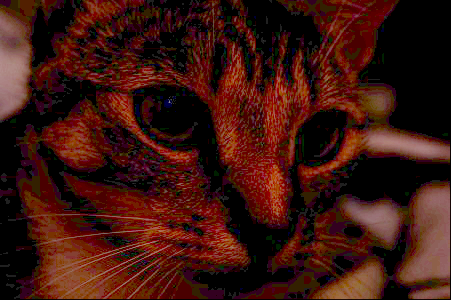

In [ ]:
img = Image.open("/content/library.png");

img_log = logTransformImage(img);
img_log

####Power-Law (Gamma) Transformations

Original


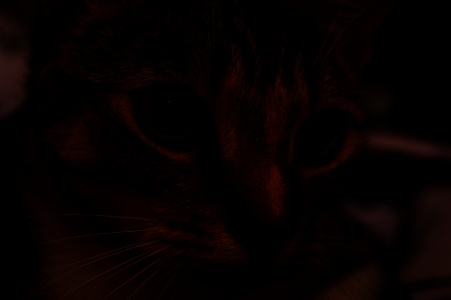

Gamma = 0.1:


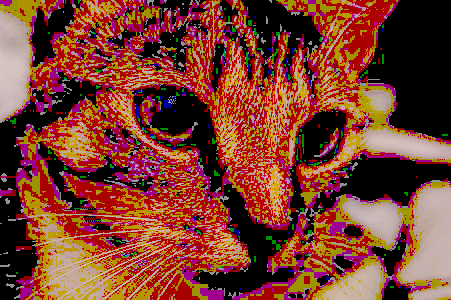





Gamma = 0.2:


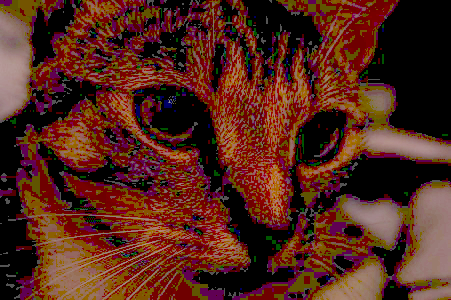





Gamma = 0.3:


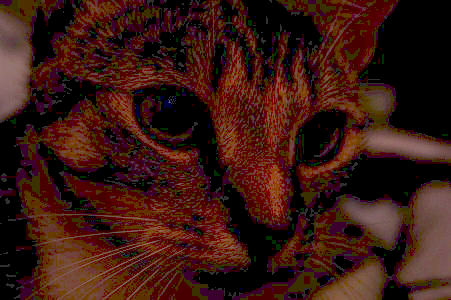





Gamma = 0.4:


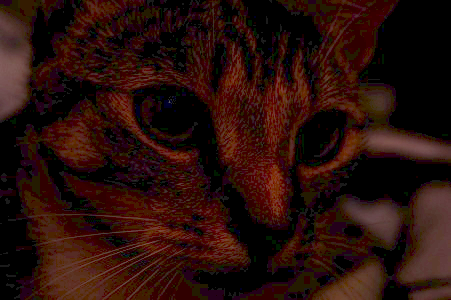





Gamma = 0.5:


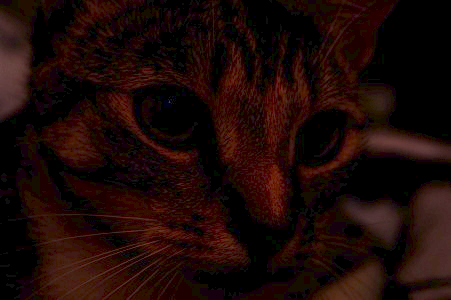





Gamma = 0.6:


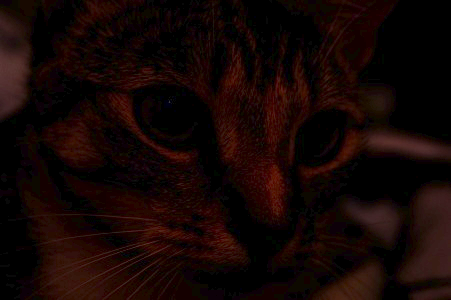





Gamma = 0.7:


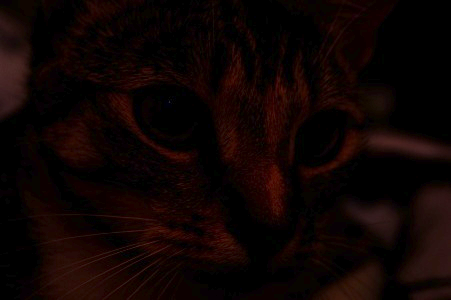





Gamma = 0.8:


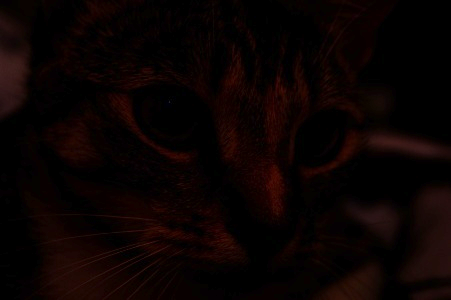





Gamma = 0.9:


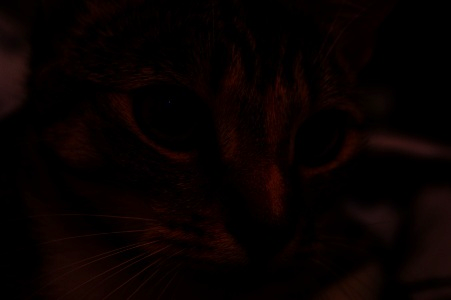





Gamma = 1.0:


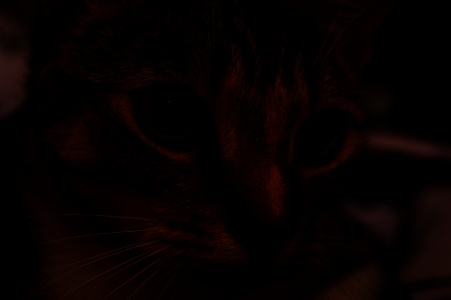

In [ ]:
print("Original")
cv2_imshow(image)
for gamma in [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]:
  print("Gamma = %.1f:"%gamma)

  gamma_corrected = np.array(255*(image / 255) ** gamma, dtype = 'uint8')
  cv2_imshow(gamma_corrected)
  print("\n\n\n")

As can be observed from the outputs as well as the graph, gamma>1, the intensity of pixels decreases which mean the image becomes darker. On the other hand, gamma<1 (indicated by the curve corresponding to 'nth root' label on the graph), the intensity increases i.e. the image becomes lighter.

###Reference<br>



Swain, A. (2018, August 28). **Noise in Digital Image Processing - Image Vision - Medium**. Retrieved August 5, 2021, from Medium website: https://medium.com/image-vision/noise-in-digital-image-processing-55357c9fab71<br>
Sanchit. (2014, April 8). **How to add noise (Gaussian/salt and pepper etc) to image in Python with OpenCV.** Retrieved August 5, 2021, from Stack Overflow website: https://stackoverflow.com/questions/22937589/how-to-add-noise-gaussian-salt-and-pepper-etc-to-image-in-python-with-opencv<br>
**Negative transformation using Python and Pillow** | Pythontic.com. (2020). Retrieved August 5, 2021, from Pythontic.com website: https://pythontic.com/image-processing/pillow/negative<br>
**Logarithmic Transformation Of An Image Using Python And Pillow** | Pythontic.com. (2020). Retrieved August 5, 2021, from Pythontic.com website: https://pythontic.com/image-processing/pillow/logarithmic%20transformation